In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()
from trackml.dataset import load_event

In [2]:
# print(os.listdir("../input/train_1"))
hits, cells, particles, truth = load_event("./train_100_events/event000001000")

In [3]:
#particles[particles.nhits > 3]
#truth[(truth.tx > 359) & (truth.ty < 360) & (truth.ty > 8) & (truth.ty < 9) & (truth.tz > 419) & (truth.tz < 420)]
truth.index = truth.hit_id
truth['dist'] = truth['tx']**2 + truth['ty']**2 + truth['tz']**2
truth.describe()

,hit_id,particle_id,tx,ty,tz,tpx,tpy,tpz,weight,dist
count,120939.00000,1.209390e+05,120939.000000,120939.000000,120939.000000,120939.000000,120939.000000,120939.000000,120939.000000,1.209390e+05
mean,60470.00000,4.103431e+17,-1.767847,4.754207,-2.309751,-528.415039,437.339355,-17.295870,0.000008,1.314263e+06
std,34912.22644,3.231682e+17,305.709686,305.167542,1061.935425,188079.062500,189807.906250,272778.718750,0.000008,1.943700e+06
min,1.00000,0.000000e+00,-1024.839966,-1025.099976,-2955.500000,-999841.000000,-999861.000000,-1000000.000000,0.000000,9.884874e+02
25%,30235.50000,1.035873e+17,-100.141998,-95.873302,-654.862000,-0.329628,-0.309520,-2.038540,0.000004,1.470971e+05
50%,60470.00000,3.648081e+17,-1.651420,1.012140,-1.759190,-0.006623,0.006257,-0.007396,0.000007,6.700030e+05
75%,90704.50000,7.115699e+17,97.251553,103.222000,655.110504,0.308269,0.329654,2.038135,0.000011,1.543707e+06
max,120939.00000,9.683079e+17,1025.349976,1024.849976,2955.500000,999910.000000,999798.000000,1000000.000000,0.000165,9.775198e+06


In [4]:
truth.head()

,hit_id,particle_id,tx,ty,tz,tpx,tpy,tpz,weight,dist
hit_id,,,,,,,,,,
1,1,0,-64.411598,-7.164120,-1502.5,250710.000000,-149908.000000,-956385.00000,0.000000,2261706.50
2,2,22525763437723648,-55.338501,0.630805,-1502.5,-0.570605,0.028390,-15.49220,0.000010,2260569.00
3,3,0,-83.828003,-1.145580,-1502.5,626295.000000,-169767.000000,-760877.00000,0.000000,2264534.75
4,4,297237712845406208,-96.122902,-8.230360,-1502.5,-0.225235,-0.050968,-3.70232,0.000008,2266813.50
5,5,418835796137607168,-62.659401,-9.375040,-1502.5,-0.281806,-0.023487,-6.57318,0.000009,2261520.25


In [5]:
hits.describe()

,hit_id,x,y,z,volume_id,layer_id,module_id
count,120939.00000,120939.000000,120939.000000,120939.000000,120939.000000,120939.000000,120939.000000
mean,60470.00000,-1.769457,4.751043,-2.314452,10.921564,5.918389,371.969117
std,34912.22644,305.714539,305.173279,1061.935303,3.365705,3.407428,529.032206
min,1.00000,-1024.839966,-1025.109985,-2955.500000,7.000000,2.000000,1.000000
25%,30235.50000,-100.146000,-95.896503,-655.799988,8.000000,4.000000,60.000000
50%,60470.00000,-1.651340,1.005920,-1.800000,9.000000,6.000000,119.000000
75%,90704.50000,97.267651,103.224003,655.799988,13.000000,8.000000,490.000000
max,120939.00000,1025.329956,1024.849976,2955.500000,18.000000,14.000000,3192.000000


In [6]:
# Analyze a few particles

hits_p1 = truth[truth.particle_id == 4503668346847232].hit_id
hits_p2 = truth[truth.particle_id == 4503737066323968].hit_id
hits_p3 = truth[truth.particle_id == 4503874505277440].hit_id
hits_p4 = truth[truth.particle_id == 824160724690407425].hit_id
h_p1 = hits[hits.hit_id.isin(hits_p1)]
h_p2 = hits[hits.hit_id.isin(hits_p2)]
h_p3 = hits[hits.hit_id.isin(hits_p3)]
h_p4 = hits[hits.hit_id.isin(hits_p4)]
trace1 = go.Scatter3d(x=h_p1.x, y=h_p1.y, z=h_p1.z, mode='markers')
trace2 = go.Scatter3d(x=h_p2.x, y=h_p2.y, z=h_p2.z, mode='markers')
trace3 = go.Scatter3d(x=h_p3.x, y=h_p3.y, z=h_p3.z, mode='markers')
trace4 = go.Scatter3d(x=h_p4.x, y=h_p4.y, z=h_p4.z, mode='markers')
trace5 = go.Scatter3d(x=[-100, -100, 100, 100, 100, 100, -100, -100, -100], 
                      y=[-100, -100, -100, -100, 100, 100, 100, 100, -100], 
                      z=[-400, 400, 400, -400, -400, 400, 400, -400, -400], mode='lines')
layout = go.Layout(margin=dict(l=0, r=0, b=0, t=0))
fig = go.Figure(data=[trace1, trace2, trace3, trace4, trace5], layout=layout)
py.iplot(fig)

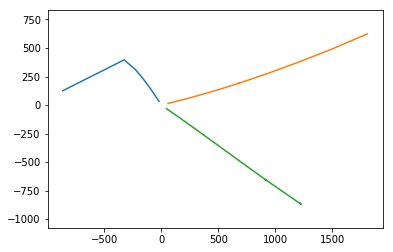

In [7]:
plt.figure()
plt.axis('equal')
plt.plot(h_p1.z, h_p1.y)
plt.plot(h_p2.z, h_p2.y)
plt.plot(h_p3.z, h_p3.y)
plt.show()

In [8]:
# ALL PARTICLES IN BOX

# Select all points close to origin
level1 = hits[(-400 < hits.z) & (hits.z < 400) & (-100 < hits.x) & (hits.x < 100) & (-100 < hits.y) & (hits.y < 100)]
level2 = hits[:]

trace = go.Scatter3d(x=level1.x, y=level1.y, z=level1.z, mode='markers', opacity=0.3)
layout = go.Layout(margin=dict(l=0, r=0, b=0, t=0))
fig = go.Figure(data=[trace], layout=layout)
py.iplot(fig)

In [9]:
# FIRST HIT FOR ALL RELEVANT PARTICLES

# Select all points close to origin
#level1 = hits[(-400 < hits.z) & (hits.z < 400) & (-100 < hits.x) & (hits.x < 100) & (-100 < hits.y) & (hits.y < 100)]
#level2 = hits[:]

origin = truth.drop_duplicates(subset='particle_id')
origin = origin[origin.particle_id.isin(particles[particles.nhits > 3].particle_id)]

trace = go.Scatter3d(x=origin.tx, y=origin.ty, z=origin.tz, mode='markers', opacity=0.3)
layout = go.Layout(margin=dict(l=0, r=0, b=0, t=0))
fig = go.Figure(data=[trace], layout=layout)
py.iplot(fig)
#origin

In [11]:
# select point closest to origin for each particle, check if same as `origin`
or2 = truth.loc[truth.groupby('particle_id')['dist'].idxmin()]
or2 = or2[or2.particle_id.isin(particles[particles.nhits > 3].particle_id)]
trace = go.Scatter3d(x=or2.tx, y=or2.ty, z=or2.tz, mode='markers', opacity=0.3)
layout = go.Layout(margin=dict(l=0, r=0, b=0, t=0))
fig = go.Figure(data=[trace], layout=layout)
py.iplot(fig)

In [12]:
p = truth[truth.particle_id == 824160724690407425]

trace = go.Scatter3d(x=p.tx, y=p.ty, z=p.tz, mode='markers', opacity=0.3)
layout = go.Layout(margin=dict(l=0, r=0, b=0, t=0))
fig = go.Figure(data=[trace], layout=layout)
py.iplot(fig)

In [15]:
origin.sum()

hit_id         2.378778e+08
particle_id    4.469912e+21
tx            -1.421986e+04
ty             1.547600e+04
tz            -1.606587e+06
tpx           -4.942831e+01
tpy            3.796490e+01
tpz            1.166257e+03
weight         1.587039e-01
dist           4.295451e+09
dtype: float64

In [16]:
or2.sum()

hit_id         2.664971e+08
particle_id    4.469912e+21
tx            -1.138467e+04
ty             8.506332e+03
tz             3.481777e+04
tpx           -6.030452e+01
tpy            3.719871e+01
tpz            1.153114e+03
weight         1.797365e-01
dist           1.413157e+09
dtype: float64

In [18]:
origin.head()

,hit_id,particle_id,tx,ty,tz,tpx,tpy,tpz,weight,dist
hit_id,,,,,,,,,,
2,2,22525763437723648,-55.338501,0.630805,-1502.5,-0.570605,0.028390,-15.49220,0.000010,2260569.00
4,4,297237712845406208,-96.122902,-8.230360,-1502.5,-0.225235,-0.050968,-3.70232,0.000008,2266813.50
5,5,418835796137607168,-62.659401,-9.375040,-1502.5,-0.281806,-0.023487,-6.57318,0.000009,2261520.25
6,6,108087696726949888,-57.085602,-8.189710,-1502.5,-0.401129,-0.035276,-10.46690,0.000008,2260832.00
7,7,968286151951515648,-73.860802,-2.575860,-1502.5,-0.442662,-0.036969,-9.13010,0.000007,2262968.25


In [19]:
or2.head()

,hit_id,particle_id,tx,ty,tz,tpx,tpy,tpz,weight,dist
hit_id,,,,,,,,,,
20880,20880,4503668346847232,-6.373050,31.601900,-20.080000,-0.074873,0.319162,-0.203232,0.000018,1442.502197
23346,23346,4503737066323968,-28.037800,14.238900,59.594200,-0.939812,0.487721,2.009650,0.000026,4540.333008
22123,22123,4503874505277440,11.586400,-31.805700,46.300201,0.239210,-0.684162,0.990678,0.000017,3289.556152
19817,19817,4504011944230912,13.543100,-29.094999,-60.747299,0.776915,-1.693210,-3.520850,0.000040,4720.168945
25689,25689,4504080663707648,-27.878099,14.570200,302.545990,-0.571877,0.287434,6.166950,0.000013,92523.554688


In [20]:
or2[or2.particle_id == 22525763437723648]

,hit_id,particle_id,tx,ty,tz,tpx,tpy,tpz,weight,dist
hit_id,,,,,,,,,,
7951,7951,22525763437723648,-30.315399,-0.095482,-822.5,-0.570993,0.006231,-15.4951,0.000016,677425.3125


In [21]:
hits_p1 = truth[truth.particle_id == 22525763437723648].hit_id
hits_p2 = truth[truth.particle_id == 4503668346847232].hit_id
h_p1 = hits[hits.hit_id.isin(hits_p1)]
h_p2 = hits[hits.hit_id.isin(hits_p2)]
trace1 = go.Scatter3d(x=h_p1.x, y=h_p1.y, z=h_p1.z, mode='markers')
trace2 = go.Scatter3d(x=h_p2.x, y=h_p2.y, z=h_p2.z, mode='markers')
layout = go.Layout(margin=dict(l=0, r=0, b=0, t=0))
fig = go.Figure(data=[trace1, trace2], layout=layout)
py.iplot(fig)

In [29]:
# or2 is the new origin
# random forest

from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier()
X = hits
y = hits.hit_id.isin(or2.hit_id)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1/6)
classifier.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [62]:
tp = hits[hits.hit_id.isin(or2.hit_id)][classifier.predict(hits[hits.hit_id.isin(or2.hit_id)])]
fp = hits[~hits.hit_id.isin(or2.hit_id)][classifier.predict(hits[~hits.hit_id.isin(or2.hit_id)])]
fn = hits[hits.hit_id.isin(or2.hit_id)][~classifier.predict(hits[hits.hit_id.isin(or2.hit_id)])]
trace1 = go.Scatter3d(x=tp.x, y=tp.y, z=tp.z, mode='markers', opacity=0.3, name="True Positive")
trace2 = go.Scatter3d(x=fp.x, y=fp.y, z=fp.z, mode='markers', opacity=0.3, name="False Positive")
trace3 = go.Scatter3d(x=fn.x, y=fn.y, z=fn.z, mode='markers', opacity=0.3, name="False Negative")
layout = go.Layout(margin=dict(l=0, r=0, b=0, t=0))
fig = go.Figure(data=[trace1, trace2, trace3], layout=layout)
py.iplot(fig)

In [56]:
classifier.predict(hits[~hits.hit_id.isin(or2.hit_id)])

array([False, False, False, ..., False, False, False])

In [46]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y, classifier.predict(X))

array([[111444,    203],
       [   705,   8587]])